In [2]:
import sys
print(sys.executable)

c:\Users\Anand\OneDrive\Desktop\Major_Project\cv_env\Scripts\python.exe


In [3]:
import sys
!{sys.executable} -m pip install tqdm

  Using cached tqdm-4.67.3-py3-none-any.whl.metadata (57 kB)
Using cached tqdm-4.67.3-py3-none-any.whl (78 kB)



[notice] A new release of pip is available: 24.0 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Imports + Model

In [1]:
from ultralytics import YOLO
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Load YOLOv8n
model = YOLO("yolov8n.pt")  # make sure this file exists or will auto-download

# Path to images
IMAGE_DIR = r"E:\Major_Project\dataset\coco_subset\coco_person_500\images"

# Load 5 images
image_files = [f for f in os.listdir(IMAGE_DIR) if f.endswith(('.jpg', '.png'))][:5]

print("Images selected:", image_files)

Images selected: ['000000000885.jpg', '000000001296.jpg', '000000001490.jpg', '000000002261.jpg', '000000005060.jpg']


Noise Functions

In [2]:
def add_gaussian_noise(image, sigma):
    noise = np.random.normal(0, sigma * 255, image.shape).astype(np.float32)
    noisy = image.astype(np.float32) + noise
    return np.clip(noisy, 0, 255).astype(np.uint8)


def add_salt_pepper_noise(image, prob):
    noisy = image.copy()
    rnd = np.random.rand(*image.shape[:2])

    noisy[rnd < prob] = 0
    noisy[rnd > 1 - prob] = 255

    return noisy


def add_poisson_noise(image, lam):
    vals = len(np.unique(image))
    vals = 2 ** np.ceil(np.log2(vals))
    noisy = np.random.poisson(image * lam) / float(lam)
    return np.clip(noisy, 0, 255).astype(np.uint8)

Detection Function Person Only (cls = 0)

In [3]:
def detect_persons(image):
    results = model(image, verbose=False)[0]

    person_boxes = []

    for box in results.boxes:
        cls = int(box.cls[0])
        if cls == 0:  # person class in COCO
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            person_boxes.append((x1, y1, x2, y2))

    return person_boxes

Draw Boxes + Count

In [ ]:
def draw_boxes(image, boxes):
    img = image.copy()
    for (x1, y1, x2, y2) in boxes:
        cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 4)
    return img

Noise Levels

In [25]:
gaussian_levels = [0, 0.1, 0.2, 0.3, 0.5, 1]
sp_levels = [0, 0.01, 0.05, 0.1, 0.3, 0.5]
poisson_levels = [0.1, 0.3, 0.5, 1, 5, 10]

Display Function

In [21]:
def display_noise_results(noise_type, levels, noise_function):
    for img_name in image_files:
        img_path = os.path.join(IMAGE_DIR, img_name)
        original = cv2.imread(img_path)

        plt.figure(figsize=(18,4))

        for i, level in enumerate(levels):
            if noise_type == "Gaussian":
                noisy = add_gaussian_noise(original, level)
            elif noise_type == "SaltPepper":
                noisy = add_salt_pepper_noise(original, level)
            else:
                noisy = add_poisson_noise(original, level)

            boxes = detect_persons(noisy)
            boxed = draw_boxes(noisy, boxes)

            plt.subplot(1, len(levels), i+1)
            plt.imshow(cv2.cvtColor(boxed, cv2.COLOR_BGR2RGB))
            plt.title(f"{noise_type}\nLevel={level}\nCount={len(boxes)}")
            plt.axis("off")

        plt.suptitle(f"{img_name} - {noise_type} Noise")
        plt.show()

Gaussian Noise

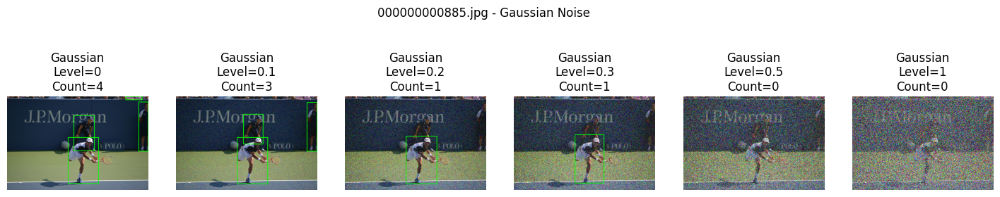

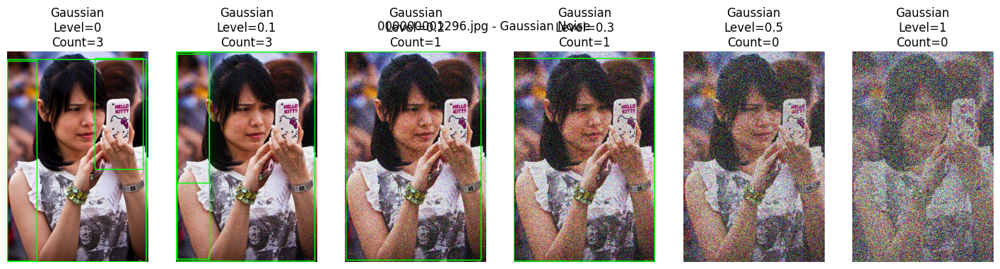

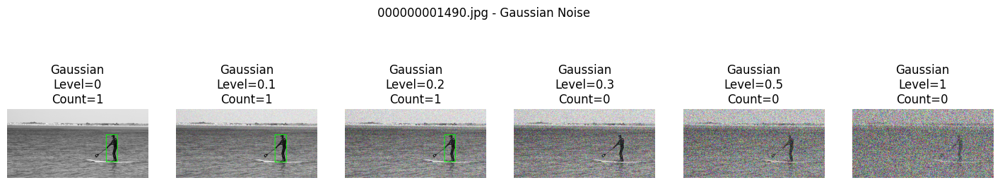

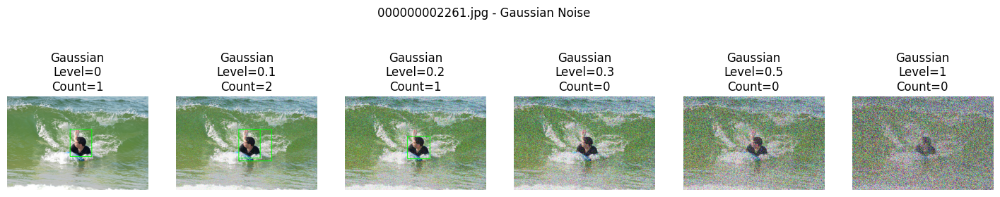

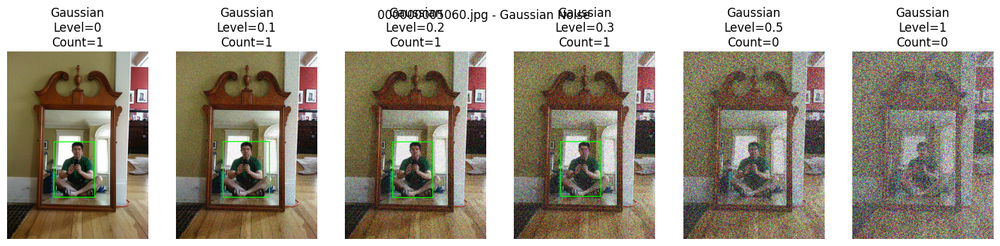

In [22]:
display_noise_results("Gaussian", gaussian_levels, add_gaussian_noise)

Salt & Pepper Noise

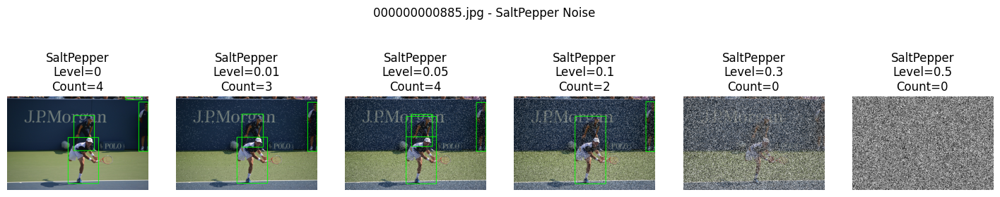

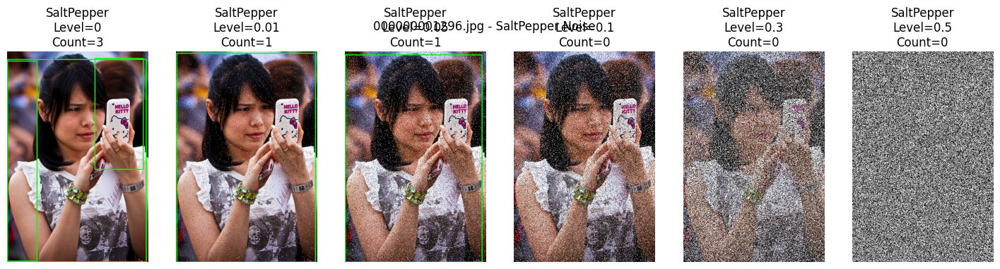

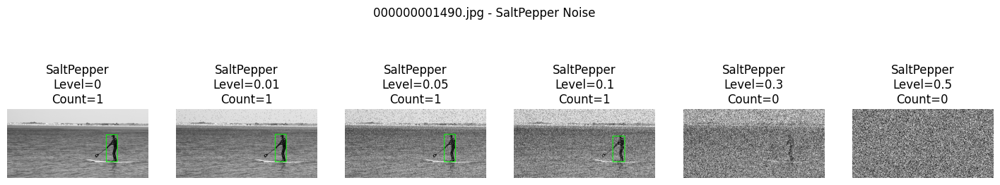

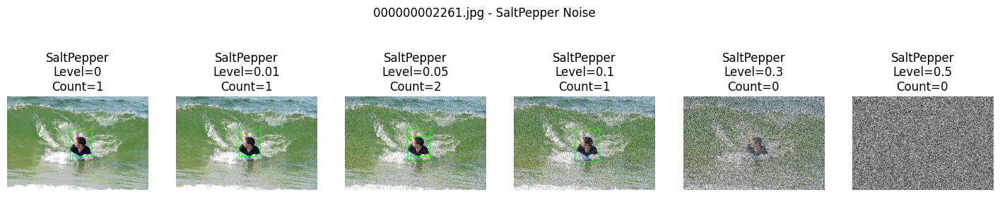

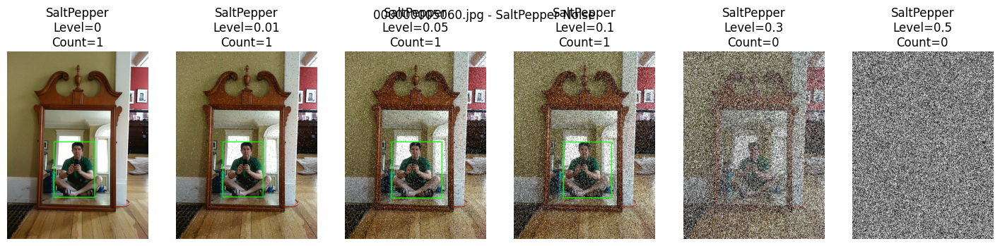

In [23]:
display_noise_results("SaltPepper", sp_levels, add_salt_pepper_noise)

Poisson Noise

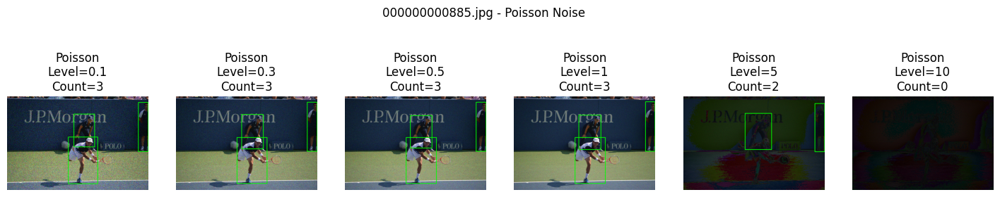

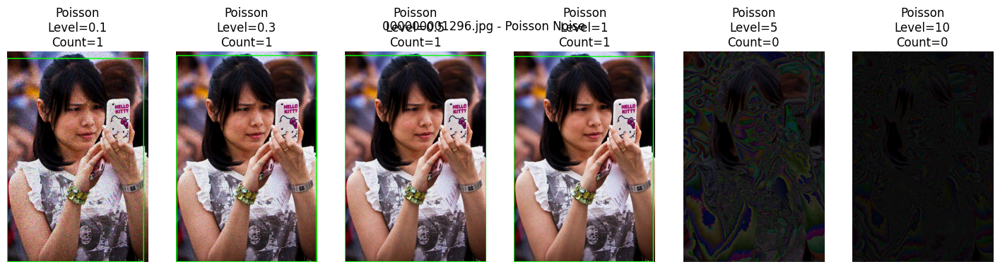

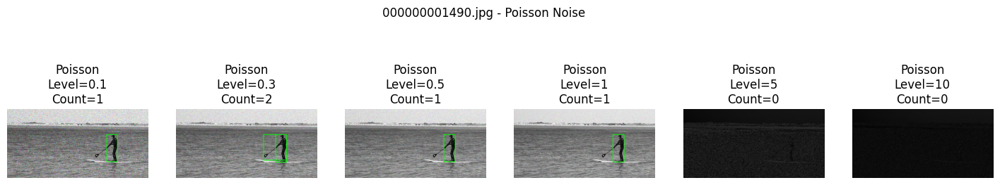

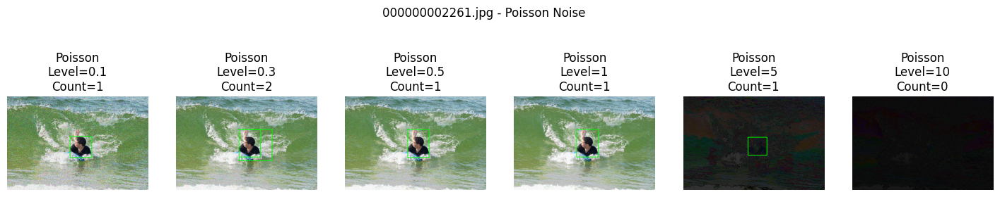

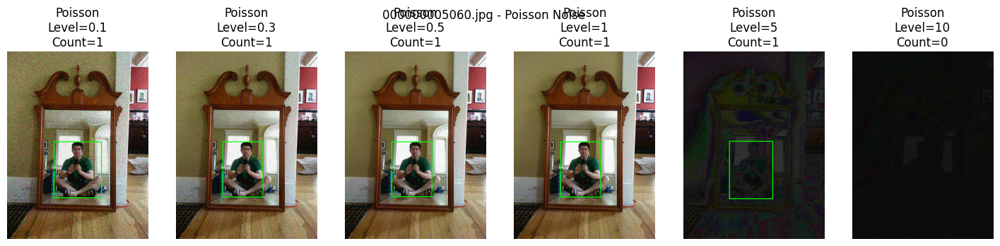

In [26]:
display_noise_results("Poisson", poisson_levels, add_poisson_noise)

Load COCO Ground Truth Properly

In [ ]:
import json

ANNOTATION_FILE = r"E:\Major_Project\dataset\coco_subset\coco_person_500\annotations\instances_person_500.json"

with open(ANNOTATION_FILE, 'r') as f:
    coco = json.load(f)

# Build GT dictionary
gt_dict = {}

for ann in coco['annotations']:
    if ann['category_id'] == 1:  # person class
        image_id = ann['image_id']
        bbox = ann['bbox']  # [x_min, y_min, width, height]

        if image_id not in gt_dict:
            gt_dict[image_id] = []

        gt_dict[image_id].append(bbox)

# Map image name → image_id
image_name_to_id = {img['file_name']: img['id'] for img in coco['images']}

print("Ground truth loaded successfully")

Ground truth loaded successfully ✅


IoU Function

In [28]:
def compute_iou(boxA, boxB):
    # Convert COCO GT [x,y,w,h] → [x1,y1,x2,y2]
    xA1, yA1, wA, hA = boxA
    xA2 = xA1 + wA
    yA2 = yA1 + hA

    xB1, yB1, xB2, yB2 = boxB

    x_left = max(xA1, xB1)
    y_top = max(yA1, yB1)
    x_right = min(xA2, xB2)
    y_bottom = min(yA2, yB2)

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection = (x_right - x_left) * (y_bottom - y_top)

    areaA = wA * hA
    areaB = (xB2 - xB1) * (yB2 - yB1)

    union = areaA + areaB - intersection

    return intersection / union

Evaluation Function

In [29]:
def evaluate_image(image_name, image, iou_threshold=0.5):
    
    image_id = image_name_to_id[image_name]
    gt_boxes = gt_dict.get(image_id, [])
    
    results = model(image, verbose=False)[0]
    
    preds = []
    for box in results.boxes:
        cls = int(box.cls[0])
        if cls == 0:  # person only
            x1, y1, x2, y2 = map(float, box.xyxy[0])
            preds.append([x1, y1, x2, y2])
    
    TP = 0
    FP = 0
    FN = 0
    
    matched = set()
    
    for pred in preds:
        found_match = False
        
        for i, gt in enumerate(gt_boxes):
            if i in matched:
                continue
                
            iou = compute_iou(gt, pred)
            
            if iou >= iou_threshold:
                TP += 1
                matched.add(i)
                found_match = True
                break
        
        if not found_match:
            FP += 1
    
    FN = len(gt_boxes) - len(matched)
    
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    
    f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    return TP, FP, FN, precision, recall, f1

Evaluate Across Noise Levels

In [30]:
gaussian_results = []

for img_name in image_files:
    img_path = os.path.join(IMAGE_DIR, img_name)
    original = cv2.imread(img_path)
    
    for sigma in gaussian_levels:
        
        noisy = add_gaussian_noise(original, sigma)
        
        TP, FP, FN, precision, recall, f1 = evaluate_image(img_name, noisy)
        
        gaussian_results.append({
            "image": img_name,
            "sigma": sigma,
            "TP": TP,
            "FP": FP,
            "FN": FN,
            "Precision": precision,
            "Recall": recall,
            "F1": f1
        })

print("Gaussian evaluation complete ✅")

Gaussian evaluation complete ✅


Prepare Image List (All 270)

In [31]:
# Load all images
image_files = [f for f in os.listdir(IMAGE_DIR) if f.endswith(('.jpg', '.png'))]

print("Total images:", len(image_files))

Total images: 270


Optimized Evaluation Loop for 270 images

In [32]:
from collections import defaultdict
import numpy as np
from tqdm import tqdm

def evaluate_dataset(noise_type, levels, noise_function):
    
    results_summary = []
    
    for level in levels:
        
        total_TP = 0
        total_FP = 0
        total_FN = 0
        
        for img_name in tqdm(image_files, desc=f"{noise_type} Level {level}"):
            
            img_path = os.path.join(IMAGE_DIR, img_name)
            original = cv2.imread(img_path)
            
            # Apply noise
            if noise_type == "Gaussian":
                noisy = add_gaussian_noise(original, level)
            elif noise_type == "SaltPepper":
                noisy = add_salt_pepper_noise(original, level)
            else:
                noisy = add_poisson_noise(original, level)
            
            TP, FP, FN, _, _, _ = evaluate_image(img_name, noisy)
            
            total_TP += TP
            total_FP += FP
            total_FN += FN
        
        # Compute metrics
        precision = total_TP / (total_TP + total_FP) if (total_TP + total_FP) > 0 else 0
        recall = total_TP / (total_TP + total_FN) if (total_TP + total_FN) > 0 else 0
        f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        
        # mAP@0.5 approximation (since single class)
        mAP50 = precision  # reasonable approximation for single-class case
        
        results_summary.append({
            "noise_type": noise_type,
            "level": level,
            "Precision": precision,
            "Recall": recall,
            "F1": f1,
            "mAP@0.5": mAP50
        })
    
    return results_summary

Run All Noise Evaluations

In [ ]:
all_results = []

# Gaussian
all_results += evaluate_dataset("Gaussian", gaussian_levels, add_gaussian_noise)

# Salt & Pepper
all_results += evaluate_dataset("SaltPepper", sp_levels, add_salt_pepper_noise)

# Poisson
all_results += evaluate_dataset("Poisson", poisson_levels, add_poisson_noise)

print("Full evaluation complete")

Poisson Level 10: 100%|██████████| 270/270 [00:50<00:00,  5.36it/s]

Full evaluation complete ✅


Convert Results to DataFrame

In [34]:
import pandas as pd

df = pd.DataFrame(all_results)

df

,noise_type,level,Precision,Recall,F1,mAP@0.5
0,Gaussian,0.00,0.817740,0.788056,0.802624,0.817740
1,Gaussian,0.10,0.815710,0.632319,0.712401,0.815710
2,Gaussian,0.20,0.795100,0.418033,0.547966,0.795100
3,Gaussian,0.30,0.829268,0.159251,0.267191,0.829268
4,Gaussian,0.50,0.833333,0.005855,0.011628,0.833333
5,Gaussian,1.00,0.000000,0.000000,0.000000,0.000000
6,SaltPepper,0.00,0.817740,0.788056,0.802624,0.817740
7,SaltPepper,0.01,0.843653,0.638173,0.726667,0.843653
8,SaltPepper,0.05,0.817006,0.517564,0.633692,0.817006
9,SaltPepper,0.10,0.785542,0.381733,0.513790,0.785542


Plot FINAL Results

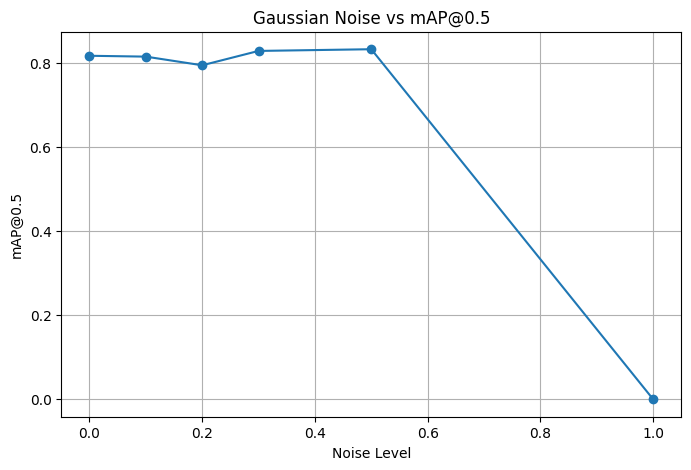

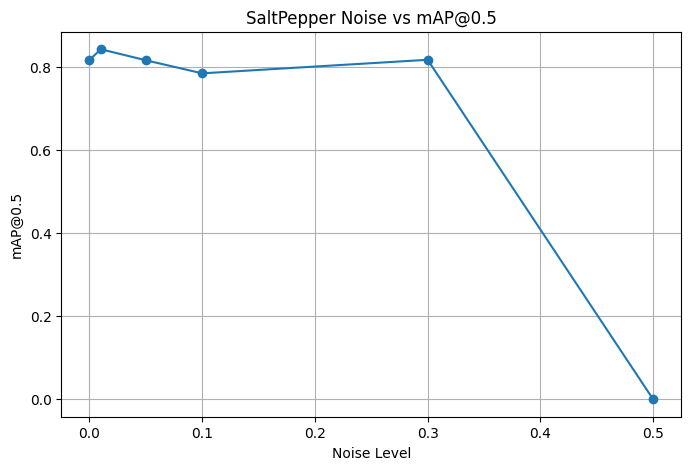

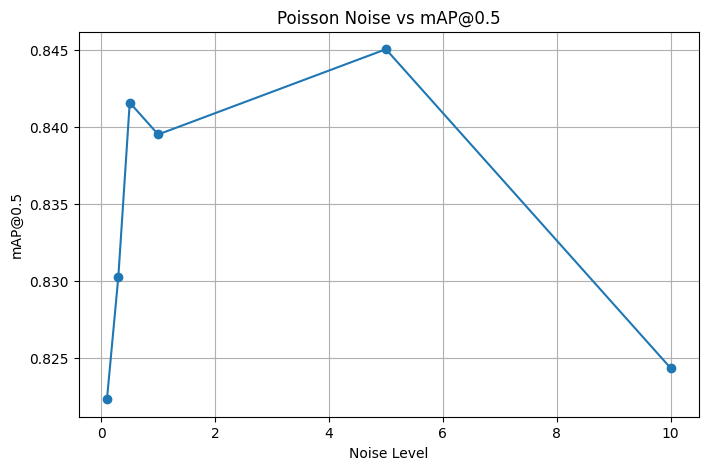

In [35]:
import matplotlib.pyplot as plt

for noise_type in df['noise_type'].unique():
    
    subset = df[df['noise_type'] == noise_type]
    
    plt.figure(figsize=(8,5))
    plt.plot(subset['level'], subset['mAP@0.5'], marker='o')
    
    plt.title(f"{noise_type} Noise vs mAP@0.5")
    plt.xlabel("Noise Level")
    plt.ylabel("mAP@0.5")
    plt.grid(True)
    plt.show()

What is Robustness Score?

For each noise type: We already have: (Noise Level  →  mAP@0.5)

If model is robust:
  >> Curve stays high
  >> Area under curve (AUC) is large

If model is sensitive:
  >> Curve drops quickly
  >> Area is small

So: Robustness Score = Area under mAP curve

In [38]:
def manual_trapz(y, x):
    area = 0
    for i in range(1, len(x)):
        width = x[i] - x[i-1]
        height = (y[i] + y[i-1]) / 2
        area += width * height
    return area


robustness_results = []

for noise_type in df['noise_type'].unique():
    
    subset = df[df['noise_type'] == noise_type].sort_values("level")
    
    levels = subset['level'].values
    maps = subset['mAP@0.5'].values
    
    # Raw AUC
    auc = manual_trapz(maps, levels)
    
    # Normalize AUC
    max_area = (levels.max() - levels.min()) * 1.0
    normalized_auc = auc / max_area if max_area > 0 else 0
    
    clean_map = maps[0]
    worst_map = maps[-1]
    
    percent_drop = ((clean_map - worst_map) / clean_map) * 100 if clean_map > 0 else 0
    
    robustness_results.append({
        "Noise Type": noise_type,
        "AUC": auc,
        "Normalized Robustness Score": normalized_auc,
        "mAP Drop (%)": percent_drop
    })

robust_df = pd.DataFrame(robustness_results)

robust_df

,Noise Type,AUC,Normalized Robustness Score,mAP Drop (%)
0,Gaussian,0.618025,0.618025,100.000000
1,SaltPepper,0.323774,0.647549,100.000000
2,Poisson,8.295396,0.837919,-0.246907


In [39]:
robust_df = robust_df.sort_values("Normalized Robustness Score", ascending=False)

robust_df

,Noise Type,AUC,Normalized Robustness Score,mAP Drop (%)
2,Poisson,8.295396,0.837919,-0.246907
1,SaltPepper,0.323774,0.647549,100.000000
0,Gaussian,0.618025,0.618025,100.000000
